# Casestudy MEL : DDA-TMT single cell melanoma data

This is case study DDA-TMT SCMS in  in this paper. The dataset is available at https://massive.ucsd.edu/ProteoSAFe/dataset.jsp?accession=MSV000089159. 

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import set_matplotlib_formats
from matplotlib.lines import Line2D
import networkx as nx
set_matplotlib_formats("svg")


/var/folders/sp/pn9txhp11mn2pyld318tpy080000gn/T/ipykernel_7158/869681028.py:8: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats("svg")


The raw spectra were identified and quantified using MaxQuant. The resulting PSMs were than processed using the methods in MSstatsTMT, including normalization across TMT mixtures using a reference channel and summarization of peptide ions into a single value per protein per channel.

### Get pilot/historical data from past similar experiment

In [4]:
import sys
sys.path.append('../code/')
from utility import show_protein_abundance_features

protein_abundance_file = "casestudy/MEL/data/meldataclean.csv" 
data = show_protein_abundance_features(protein_abundance_file)


First few rows of the protein abundance matrix:
   DHX15_HUMAN  G3P_HUMAN  HSPB1_HUMAN  ENOA_HUMAN  NPM_HUMAN  HS90A_HUMAN  \
0     9.368920  10.167968    11.777913   10.920721  10.906010    10.335122   
1     9.489853  10.180817    10.818609   10.871440  10.889861    10.396813   
2     9.766231  10.706837    11.750412   12.442845  12.427367    11.026080   
3    10.048671   9.803506    11.674774   11.818872  11.919689    10.957868   
4    10.155918  10.459226    12.510192   11.998972  11.544736    11.230470   

   HNRPC_HUMAN  HS90B_HUMAN  ANXA5_HUMAN  H14_HUMAN  ...  RS23_HUMAN  \
0    10.634692    11.553578     9.207920  11.360237  ...   11.271160   
1    10.330118    11.014594     9.597437  11.422972  ...   11.973722   
2    10.609098    11.076089    11.808549  11.638560  ...   11.030231   
3    10.552753    11.523332    11.582727  11.269536  ...   11.456930   
4    10.727446    11.372416    11.370214  11.708166  ...   11.388214   

   TYB10_HUMAN  RS4X_HUMAN   H4_HUMAN  RL23_HUMAN 

### Step2(optional): Prior Knowledge Network creation 


The figure below shows the prior knowledge network queried from INDRA. It comprises 1300 nodes, connected by a total of 6567 directed edges.

In [5]:
sys.path.append('code/')
from makepkn import plot_indra
indra_file = "casestudy/MEL/network/indra.tsv" 
plot_indra(indra_file)

INDRA data loaded successfully from casestudy/MEL/network/indra.tsv


The figure is combined graph obtained using combination of pkn from INDRA and  structure learning using PC algorithm

<div>
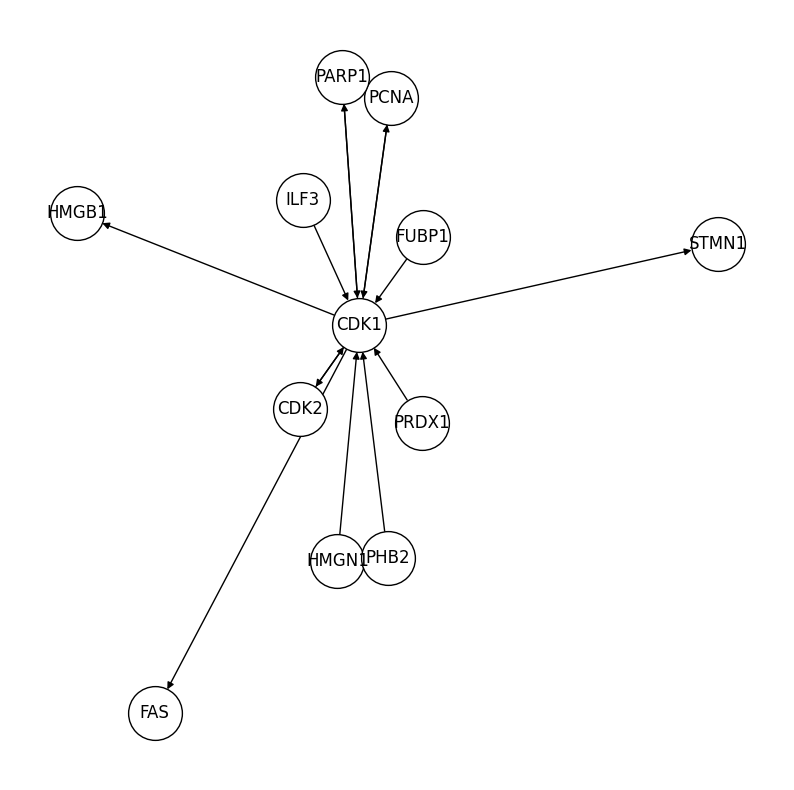
</div>


## Simulating realistic data using copula model 

In [14]:
num_of_simulations = 10
train = pd.read_csv('') 
test = pd.read_csv('')
from copulas.multivariate import GaussianMultivariate

for i in range(num_of_simulations):
    model = utility.simulatecopula(dataset)
    synthetic = utility.sample(model,len(dataset))
#     synthetic.to_csv('crc/copula/crc0_gm_copula_'+str(i)+'.csv',index=False)


NameError: name 'df_with_0' is not defined

## Step 4: Evaluating realism

#### Visual Metrics

In [17]:
import plotly.express as px
sim0 = pd.read_csv('casestudy/mel/copula/combined_train_bioreplicate_0_knn_imputed_300.csv')
sim1 = pd.read_csv('casestudy/mel/copula/combined_train_bioreplicate_1_knn_imputed_300.csv')
sim0['Condition']=0
sim1['Condition']=1
sim = pd.concat([sim0,sim1])

,RACK1_HUMAN,RAC1_HUMAN,MCM2_HUMAN,MCM4_HUMAN,MCM5_HUMAN,MCM6_HUMAN,MCM7_HUMAN,MCM3_HUMAN,Condition
0,8.526171,9.529596,7.147943,7.767708,10.382656,7.198078,8.224877,7.804099,0
1,9.110609,10.032487,8.117547,9.694644,10.048787,9.564424,8.816904,9.186118,0
2,9.378294,10.896637,9.782270,9.103759,10.111614,10.108658,9.887167,9.949161,0
3,7.418642,10.361642,7.903050,8.726176,9.128656,8.577475,8.917715,7.715080,0
4,9.420726,10.985254,10.244213,9.470307,9.890969,9.362550,9.571458,9.375655,0


In [21]:
fig = px.histogram(sim, x="RACK1_HUMAN" , color="Condition",
                  marginal="box", histnorm='probability density')
fig.show()

<Axes: xlabel='Condition', ylabel='RACK1_HUMAN'>

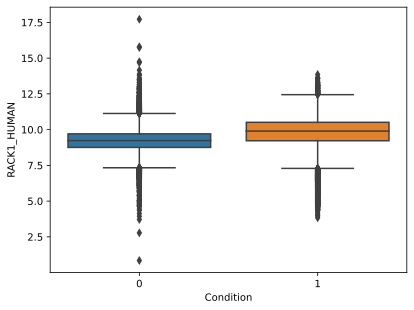

In [22]:
protname = "RACK1_HUMAN"

sns.boxplot(data=sim, x="Condition", y=protname)

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import scipy.cluster.hierarchy as sch
import numpy as np
# df = data0
df = data1
X = df.corr().values
X[np.isnan(X)]= 0
d = sch.distance.pdist(X)   # vector of ('55' choose 2) pairwise distances
L = sch.linkage(d, method='complete')
ind = sch.fcluster(L, 0.5*d.max(), 'distance')
columns = [df.columns.tolist()[i] for i in list((np.argsort(ind)))]
df = df.reindex(columns, axis=1)

plot_corr(df, size=18)


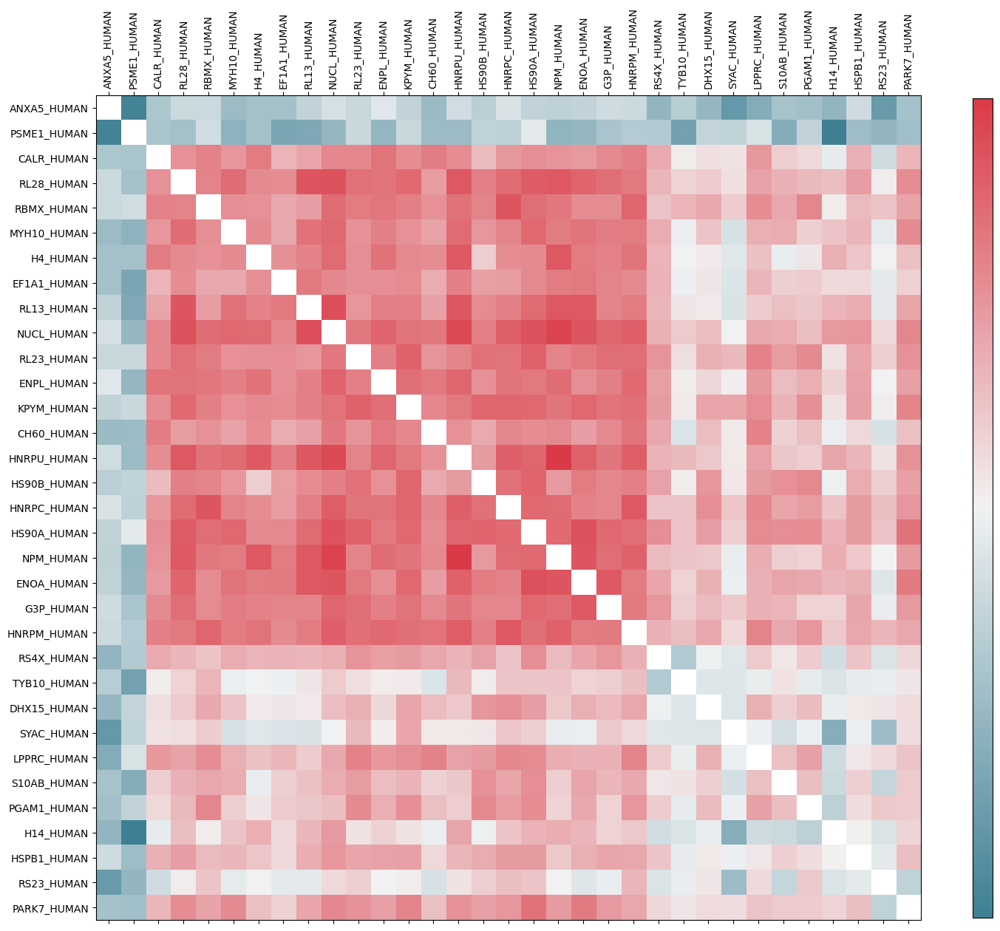


In [ ]:
fake = data11
fake = fake.reindex(columns, axis=1)
plot_corr(fake,size=18)
plt.savefig('data_plotsim.png')

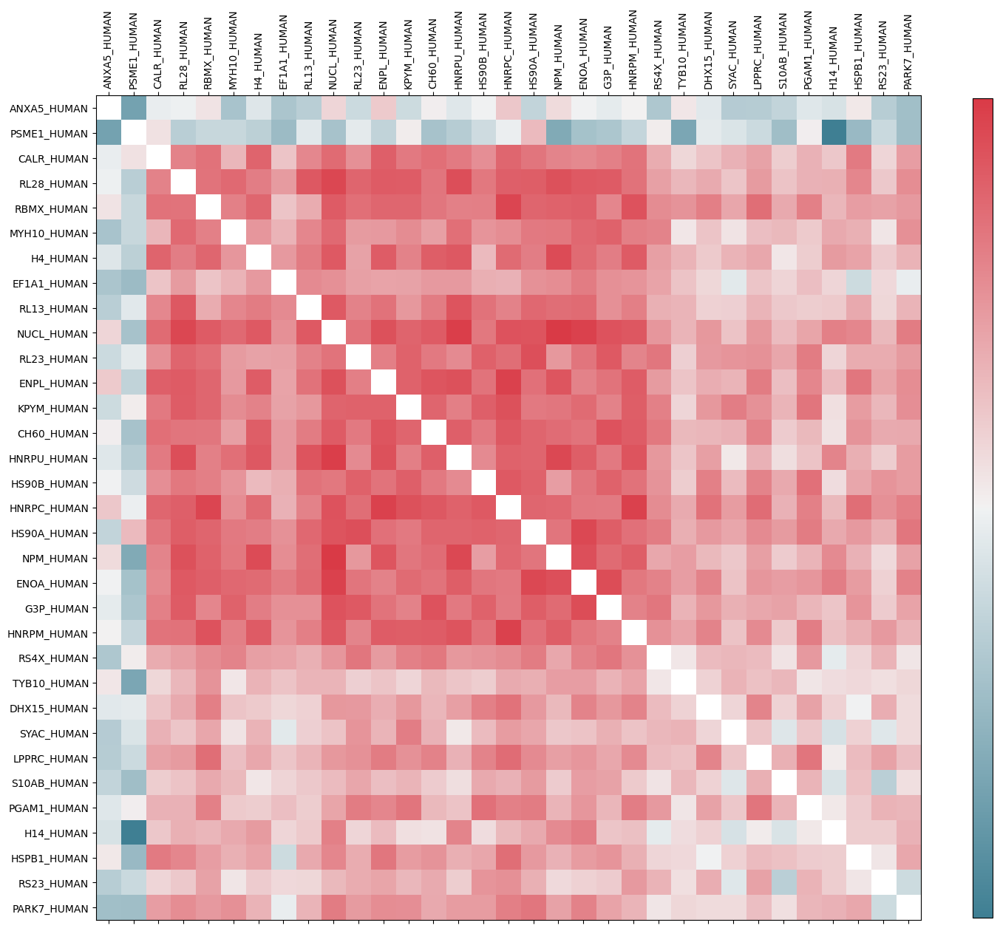

#### Similarity Score

In [ ]:
from table_evaluator import load_data, TableEvaluator
# table_evaluator = TableEvaluator(sim[sim['Method'] == 'Real'].drop(columns='Method'), sim[sim['Method'] == 'PP'].drop(columns='Method') , cat_cols=['Condition'])
# table_evaluator = TableEvaluator(final_combined_df[final_combined_df['Source'] == 'Experimental'].drop(columns='Source'), final_combined_df[final_combined_df['Source'] == src].drop(columns='Source') , cat_cols=['Condition'])
# table_evaluator.visual_evaluation()
table_evaluator.evaluate(target_col='Condition'

## Step 5: Selecting sample size appropriate for downstream application

#### Class Prediction

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
import numpy as np

filepath = 'pdacdia/data/'
data0 = pd.read_csv(filepath +'test_pdac15dia_0.csv')
data0 = data0.drop('Sample type',axis=1)
data1 = pd.read_csv(filepath +'test_pdac15dia_1.csv')
data1 = data1.drop('Sample type',axis=1)
data0['Condition']=0
data1['Condition']=1
data = pd.concat([data0,data1])
rdata = data
# Set up dictionaries to store min and max accuracies for each sample size

# filepath = 'pdac/'
# filepath = 'mel/'
# filepath = 'crc/'
# filepath = 'pdacsrm/'
filepath = 'pdacdia/'
# Set the sample sizes
sample_sizes = [5,10,20,30,40,50,60,70,80,90,100]
# sample_sizes = [5, 10, 20, 30, 40, 50, 100]
# sample_sizes = [100,300,500]
print("Per-protein")
min_accuracies = []
max_accuracies = []
accuracies = []
# Call the function for each sample size
for sample_size in sample_sizes:
    simulated_data0_pp = pd.read_csv(filepath+'perprotein/combined_train0.csv')
    simulated_data1_pp = pd.read_csv(filepath+'perprotein/combined_train1.csv')
    # Add a condition column
    simulated_data0_pp['Condition'] = 0
    simulated_data1_pp['Condition'] = 1

    # Concatenate the datasets
    simulated_data = pd.concat([simulated_data0_pp, simulated_data1_pp], ignore_index=True)
#         simulated_data = rdata
    # Run your analysis (e.g., Random Forest)
    accuracy, mina, maxa = run_random_forest(simulated_data, sample_size, rdata,False)

    accuracies.append(accuracy)
    
    min_accuracies.append(mina)
    max_accuracies.append(maxa) 

    print(f'Sample Size: {sample_size}, Average Accuracy: {accuracy:.4f}, Min Accuracy: {mina:.4f}, Max accuracy: {maxa:.4f}')


In [ ]:
import matplotlib.pyplot as plt
import matplotlib

crc_data_val = pdac_data_val
# Plotting
# matplotlib.rcParams.update({'font.size': 22})
font = {'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

plt.figure(figsize=(12, 8))
# Plot REAL
plt.plot(crc_data_val['Sample Size'], crc_data_val['Accuracy'],label='Experimental',marker='o', color='red')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['min'], crc_data_val['max'], color='red', alpha=0.3)


# Plot PP
plt.plot(crc_data_val['Sample Size'], crc_data_val['PP Accuracy'], label='PP',marker='o', color='blue')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['PP min'], crc_data_val['PP max'], color='blue', alpha=0.3)

# Plot CO
plt.plot(crc_data_val['Sample Size'], crc_data_val['CO Accuracy'], label='CO',marker='o', color='orange')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['CO min'], crc_data_val['CO max'], color='orange', alpha=0.3)


# Plot TVAE
plt.plot(crc_data_val['Sample Size'], crc_data_val['TVAE Accuracy'], label='TVAE',marker='o', color='green')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['TVAE min'], crc_data_val['TVAE max'], color='green', alpha=0.3)

# Labels and legend
plt.xlabel('Sample Size')
plt.ylabel('Accuracy')
# plt.title('Accuracy vs Sample Size for Different Methods')
# plt.legend()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# Show plot
# plt.grid(True)
plt.show()


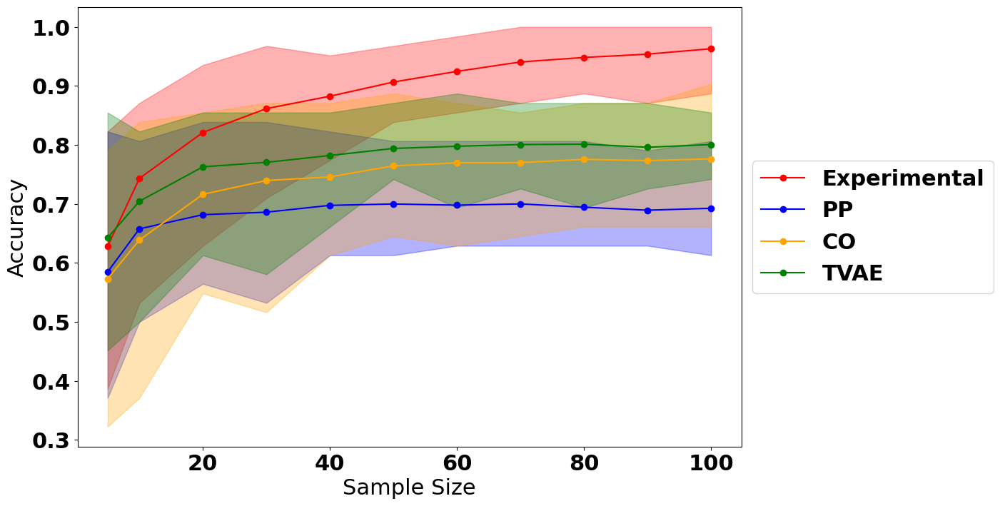

##### Class Discovery

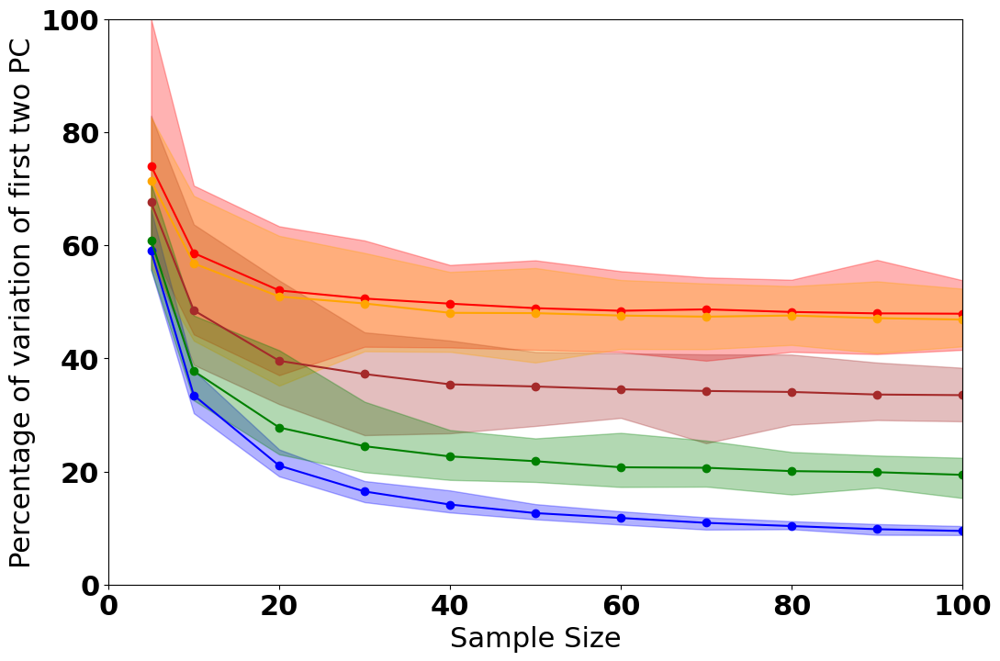

##### Class Comparison

##### Scalability analysis